In [2]:
import scvi
import torch
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.pyplot import rc_context
import os
import pandas as pd

sc.settings.set_figure_params(dpi=300, figsize=(4,4), facecolor='white')

data_dir = '/dfs3b/swaruplab/smorabit/analysis/cmcf_iop/data/AD_snRNA_datasets/'


# Part 0: Re-load the integrated dataset:

In [6]:
adata = sc.read_h5ad('{}AD_atlas_integrated.h5ad'.format(data_dir))

# Part 1: Load datasets as adata objects

In [2]:

datasets = ["Morabito", 'Mathys', 'Grubman', 'Zhou', 'Leng_EC', 'Leng_SFG']


In [3]:
adata_list = []
for dataset in datasets:
    print(dataset)

    # load sparse matrix:
    X = io.mmread("{}{}_counts.mtx".format(data_dir, dataset))

    # create anndata object
    adata = anndata.AnnData(
        X=X.transpose().tocsr()
    )

    # load sample metadata:
    sample_meta = pd.read_csv("{}{}_meta.csv".format(data_dir, dataset))

    # load gene names:
    with open("{}{}_gene_names.csv".format(data_dir, dataset), 'r') as f:
        gene_names = f.read().splitlines()


    adata.obs = sample_meta
    adata.obs.index = adata.obs['barcode']
    adata.obs = adata.obs.drop(labels='barcode', axis=1)
    adata.var.index = gene_names
    
    # append to adata list:
    adata_list.append(adata)

Morabito
Mathys
Grubman
Zhou
Leng_EC
Leng_SFG


In [16]:
# filter out data from zhou et al because they didn't do it before RIP
adata_list[3].var['mt'] = adata_list[3].var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata_list[3], qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

adata_list[3] = adata_list[3][adata_list[3].obs['pct_counts_mt'] <= 10]
adata_list[3] = adata_list[3][adata_list[3].obs['total_counts'] >= 500]
adata_list[3] = adata_list[3][adata_list[3].obs['total_counts'] <= 25000]


#seurat_zhou <- subset(seurat_zhou, percent.mt <= 10 & nCount_RNA >= 500 & nCount_RNA <= 25000)



In [17]:
adata_list[3].shape

(85157, 33694)

In [18]:
# combine all adata objects
adata = adata_list[0].concatenate(adata_list[1:])

In [19]:
# save unprocessed data:
adata.write('{}AD_atlas_unprocessed.h5ad'.format(data_dir))

... storing 'Age' as categorical
... storing 'Sex' as categorical
... storing 'SampleID' as categorical
... storing 'DonorID' as categorical
... storing 'Batch' as categorical
... storing 'Original_cluster' as categorical
... storing 'Dataset' as categorical
... storing 'Region' as categorical
... storing 'Condition' as categorical


# Part 2: Integrate data using scvi

In [5]:
import scvi
import torch
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import os
import pandas as pd

sc.settings.set_figure_params(dpi=300, figsize=(4,4), facecolor='white')
torch.cuda.is_available()

True

In [5]:
# load adata:
adata = sc.read_h5ad('{}AD_atlas_unprocessed.h5ad'.format(data_dir))

In [6]:
adata.obs.Dataset.value_counts()

Leng        106136
Zhou         85157
Mathys       70634
Morabito     61472
Grubman      13214
Name: Dataset, dtype: int64

In [7]:
# pre-processing
sc.pp.filter_genes(adata, min_counts=3)
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # freeze the state in `.raw`

In [8]:
# feature selection
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=3000
)

## Part 2.1: Train SCVI model

In [9]:
# make a column for dataset + batch 
adata.obs['dataset_batch'] = ['{}_{}'.format(adata.obs['Dataset'][i],adata.obs['Batch'][i]) for i in range(adata.shape[0]) ]

In [463]:
# scvi setup
scvi.data.setup_anndata(
    adata,
    layer="counts",
    batch_key = 'SampleID',
    categorical_covariate_keys=['dataset_batch', 'Region', 'Condition']
)

INFO     Using batches from adata.obs["SampleID"]                                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              


AssertionError: Don’t call _normalize_index with non-categorical/string names

In [28]:
# setup SCVI model
model = scvi.model.SCVI(
    adata,
    n_hidden = 128,
    n_latent = 20,
    n_layers = 1,
    dropout_rate = 0.1,
    use_cuda = True
)

WARNING  Make sure the registered X field in anndata contains unnormalized count data.       


In [ ]:
model.train()

In [13]:
# save the model
model.save("trained_model4/") 

In [7]:
# re-load the model:
scvi.data.setup_anndata(
    adata,
    layer="counts",
    batch_key = 'SampleID',
    categorical_covariate_keys=['dataset_batch', 'Region', 'Condition', 'braak']
)

model = scvi.model.SCVI.load(adata, "trained_model4/", use_cuda=True)


INFO     Using batches from adata.obs["SampleID"]                                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 336613 cells, 16641 genes, 124    
         batches, 1 labels, and 0 proteins. Also registered 4 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [16]:
# move latent representation to the adata object
latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent

# move normalized expression to adata object
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

## Part 2.2: Use latent space to make UMAP + clusters

In [17]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", metric='cosine')
sc.tl.umap(adata, min_dist=0.3)

# add umap to obs table
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]



In [18]:
# run clustering with default settings
sc.tl.leiden(adata)

In [29]:
# save integrated adata obj
del adata.uns['_scvi']
adata.write('{}AD_atlas_integrated.h5ad'.format(data_dir))

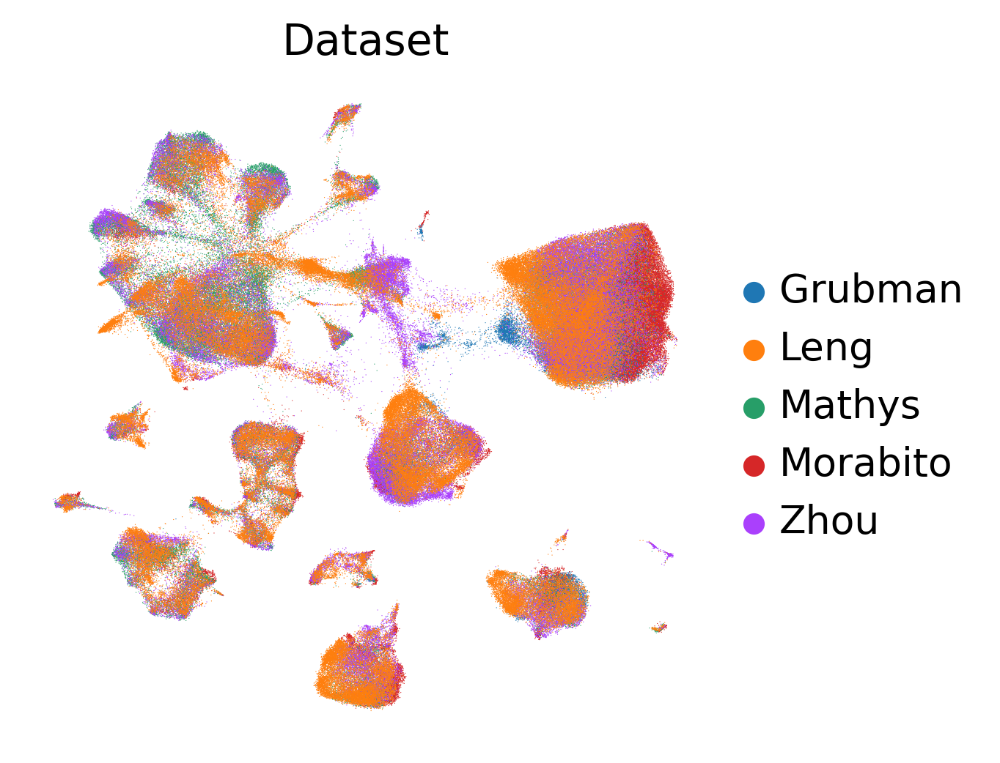

In [20]:
# plot clusters:
sc.pl.umap( adata,color=["Dataset"],frameon=False,)

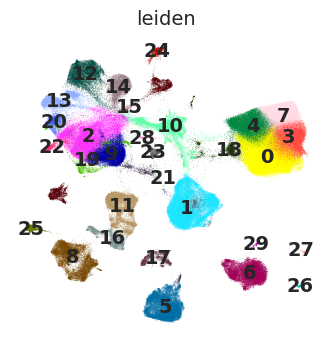

In [266]:
sc.pl.umap( adata,color=["leiden"],frameon=False,legend_loc='on data', save='_clusters.pdf')


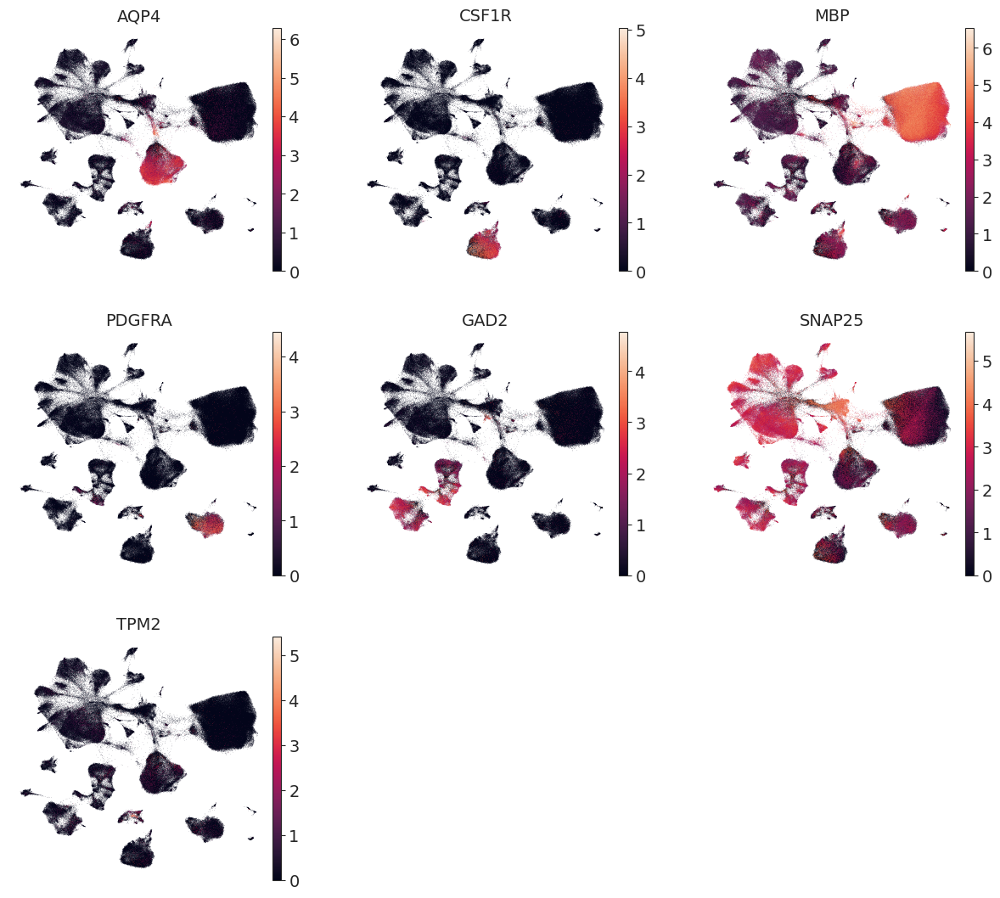

In [268]:
# plot cell type marker genes:
markers = ["AQP4", "CSF1R", "MBP", "PDGFRA", "GAD2", "SNAP25", "TPM2"]
sc.pl.umap(
    adata,
    color=markers,
    frameon=False,
    ncols=3
)

## FeaturePlot of a gene 

I wrote my own featureplot with blackjack and hookers because scanpy doesn't let you split by group

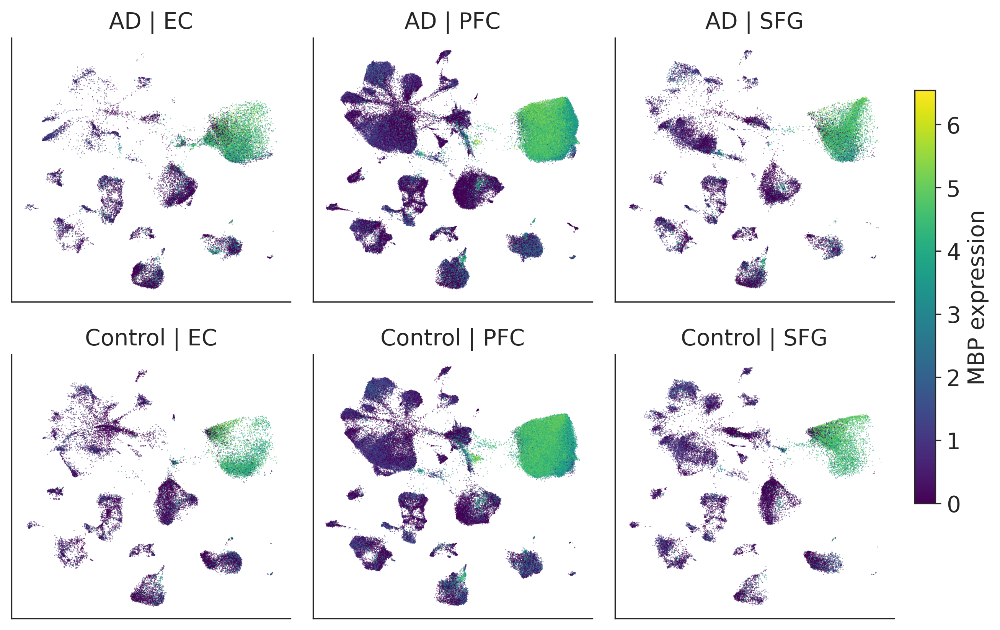

In [175]:

# select gene 
# cur_gene = 'GFAP'
cur_gene = 'MBP'

# add expression to the obs table 
adata.obs['expression'] = adata.X[:,adata.var.index.to_list().index(cur_gene)].todense()

# set color palette
cmap = sns.color_palette("viridis", as_cmap=True)

# set seaborn theme
sns.set_style("white")

# what variables to facet by:
g = sns.FacetGrid(adata.obs, col='Region', row='Condition')

# plot the UMAP
g.map_dataframe(
    sns.scatterplot,
    x='UMAP_1',
    y='UMAP_2',
    hue = 'expression',
    linewidth=0,
    alpha=0.5,
    s=0.5,
    rasterized=True,
    palette=cmap
)

# remove axis ticks
g.set(yticks=[])
g.set(xticks=[])
g.set(title=None)

# set the title for each panel
g.set_titles(col_template="{col_name}", row_template="{row_name}")

# Make space for the colorbar
g.fig.subplots_adjust(right=.92)

# Define a new Axes where the colorbar will go
cax = g.fig.add_axes([.94, .25, .02, .6])

# add the colorbar
points = plt.scatter([], [], c=[], vmin=adata.obs.expression.min(), vmax=adata.obs['expression'].max(), cmap=cmap)
g.fig.colorbar(points, cax=cax, label='{} expression'.format(cur_gene))

# save plot 
plt.savefig("figures/{}_featureplot_split.pdf".format(cur_gene), dpi=600)



## Differential Gene Expression

Use trained SCVI model to perform 1 vs all DGE tests for each leiden cluster:

In [236]:
# differential expression
de_df = model.differential_expression(
    groupby='leiden'
    #group1='0',group2='5'
)

de_df.to_csv('scvi_leiden_DEGs.csv')

In [251]:
de_df[de_df.lnbf >= 1.1].comparison.value_counts()

27 vs Rest    3706
26 vs Rest     945
17 vs Rest     813
5 vs Rest      718
22 vs Rest     387
1 vs Rest      374
10 vs Rest     259
23 vs Rest     248
18 vs Rest     239
19 vs Rest     211
6 vs Rest      205
25 vs Rest     204
20 vs Rest     184
24 vs Rest     177
29 vs Rest     173
16 vs Rest     172
28 vs Rest     169
11 vs Rest     154
3 vs Rest      147
8 vs Rest      131
9 vs Rest      117
13 vs Rest     113
0 vs Rest      109
15 vs Rest     104
2 vs Rest      100
14 vs Rest      98
12 vs Rest      93
7 vs Rest       52
21 vs Rest      27
4 vs Rest       24
Name: comparison, dtype: int64

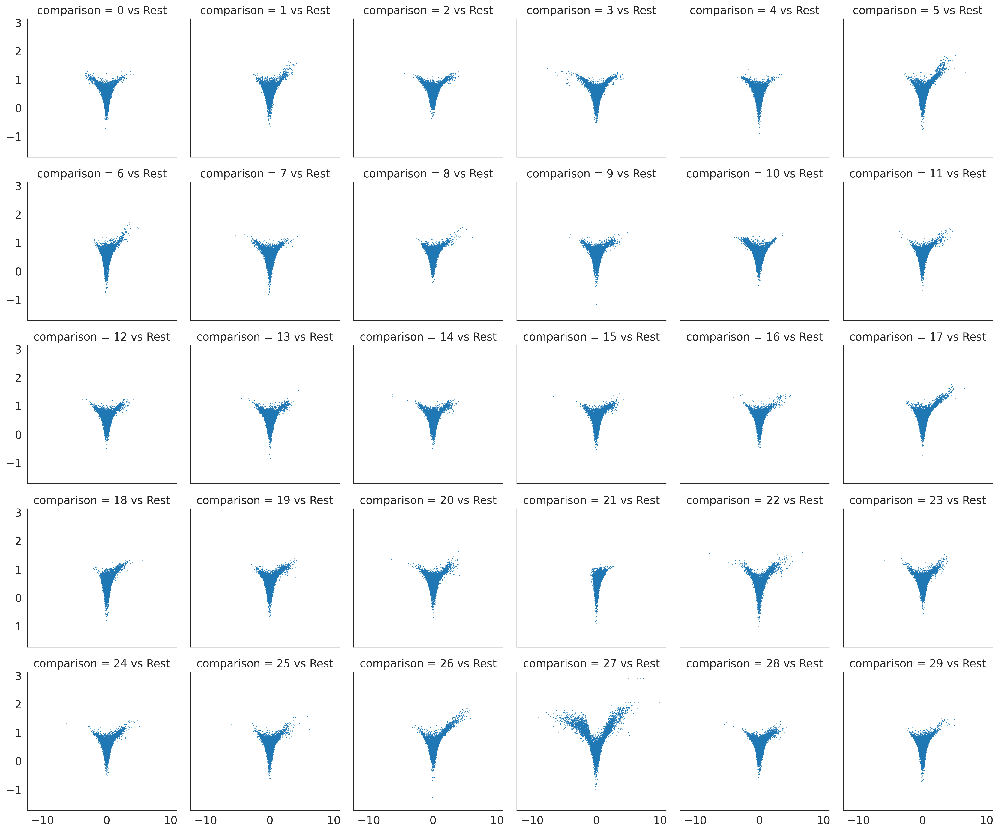

In [252]:
# compute natural log of bayes factor:
de_df = de_df.assign(lnbf = lambda x: np.log(x['bayes_factor']))



sns.set_style("white")
g = sns.FacetGrid(de_df, col='comparison', col_wrap=6)
g.map_dataframe(
    sns.scatterplot,
    x='lfc_median',
    y='lnbf',
    linewidth=0,
    alpha=1,
    s=0.5,
    rasterized =True
)


## Cell type annotation

Use the following marker genes to identify cell types.

Here I was actually able to identify 3 doublet clusters. In this case, I am going to remove these cells and perform UMAP + clustering once again.

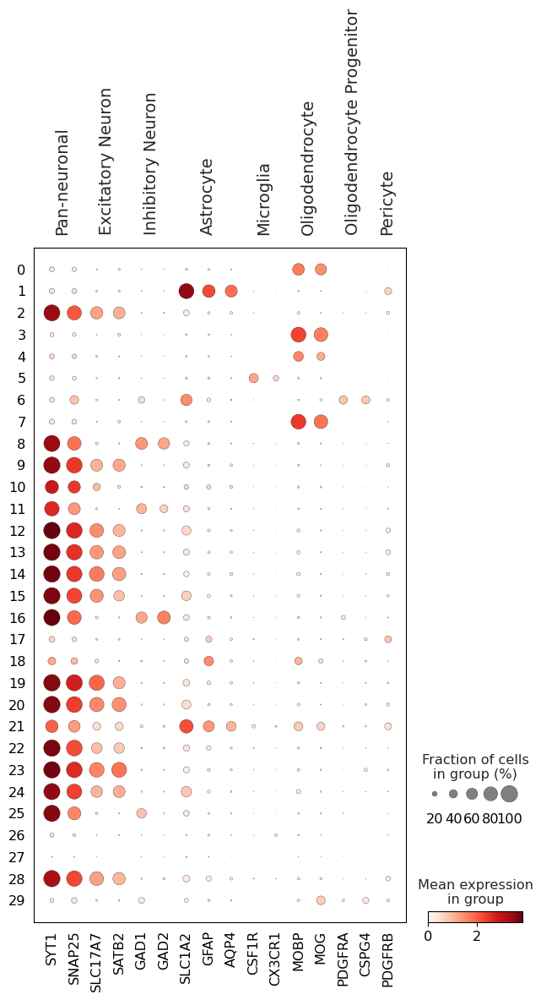

In [264]:
marker_dict = {
    'Pan-neuronal': ['SYT1', 'SNAP25'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2'],
    'Astrocyte': ['SLC1A2', 'GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1'],
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4'],
    'Pericyte': ['PDGFRB']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(adata, marker_dict, 'leiden', dendrogram=False, save='markers_leiden.pdf')


<AxesSubplot:ylabel='Original_cluster'>

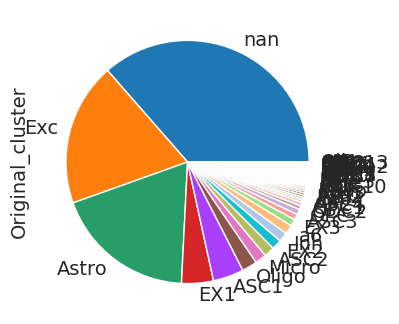

In [305]:
sc.set_figure_params(dpi=100)
adata.obs[adata.obs.leiden == '21'].Original_cluster.value_counts().plot(kind='pie')

<AxesSubplot:ylabel='Original_cluster'>

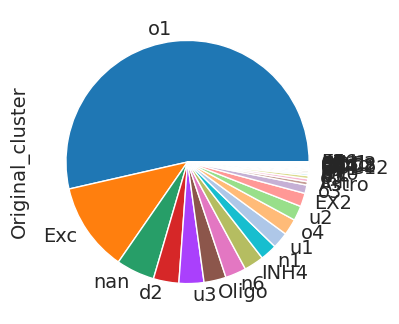

In [292]:
adata.obs[adata.obs.leiden == '18'].Original_cluster.value_counts().plot(kind='pie')

In [8]:
# remove cells from doublet clusters:
adata.obs['leiden_initial'] = adata.obs['leiden']
adata = adata[~adata.obs.leiden.isin(['10', '18', '21'])]

## UMAP + clustering without doublets:

In [9]:
adata.obs['UMAP_initial_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_initial_2'] = adata.obsm['X_umap'][:,1]

Trying to set attribute `.obs` of view, copying.


In [10]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", metric='cosine')
sc.tl.umap(adata, min_dist=0.3)

# add umap to obs table
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]

In [11]:
sc.tl.leiden(adata)

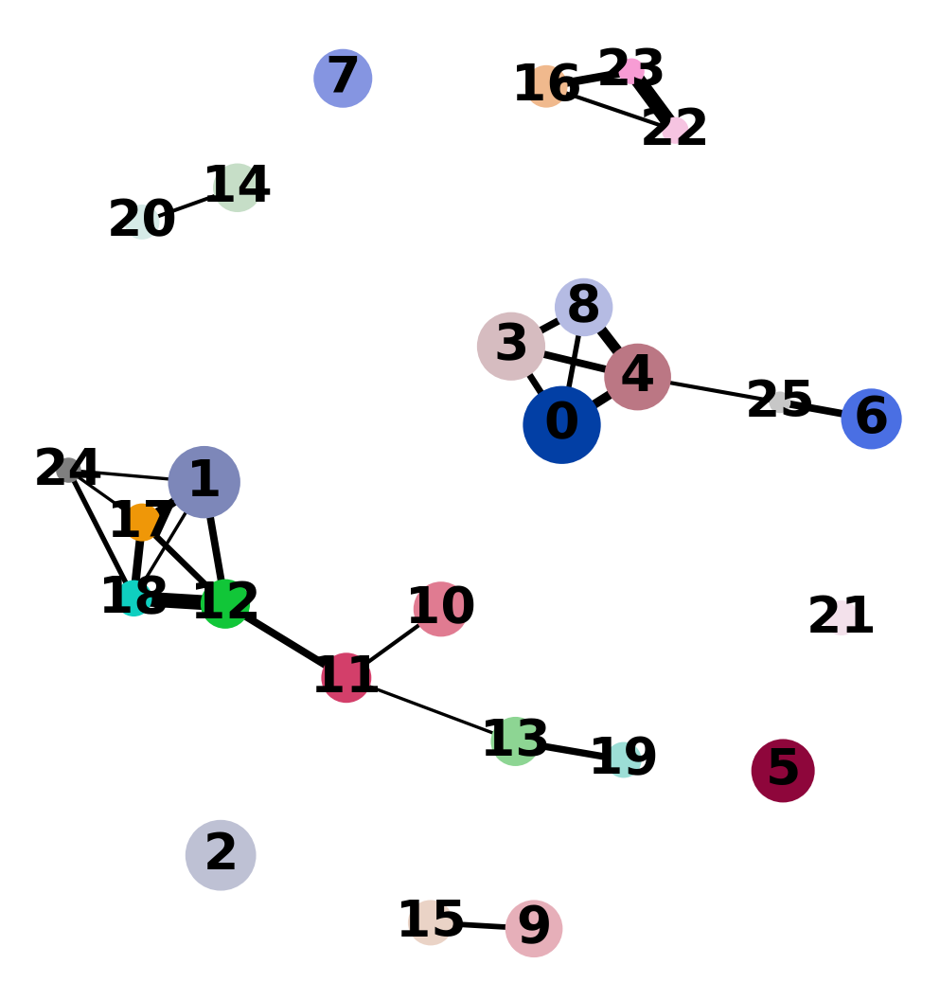

In [12]:
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.2, title='', edge_width_scale=0.5,
    frameon=False
)

In [13]:
sc.tl.umap(adata, min_dist=0.35, init_pos='paga')

# add coords to obs table
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]

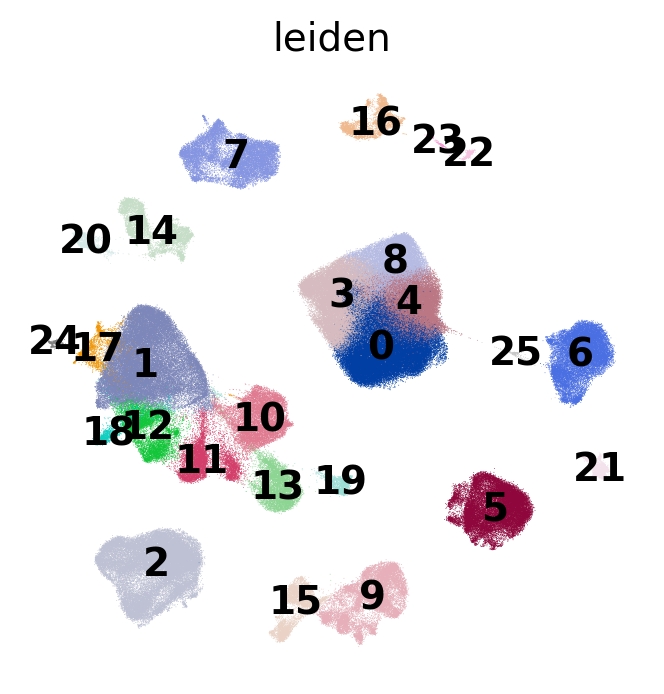

In [14]:
sc.set_figure_params(dpi=200)
ax = sc.pl.umap( adata,color=["leiden"],frameon=False,legend_loc='on data', save='_clusters_redo.pdf')

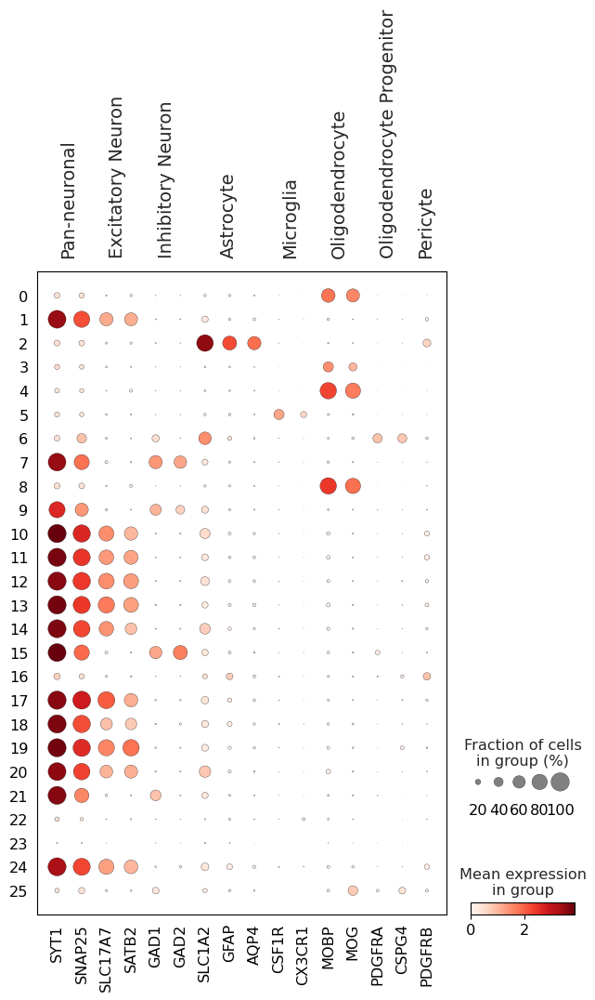

In [325]:
marker_dict = {
    'Pan-neuronal': ['SYT1', 'SNAP25'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2'],
    'Astrocyte': ['SLC1A2', 'GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1'],
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4'],
    'Pericyte': ['PDGFRB']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(adata, marker_dict, 'leiden', dendrogram=False, save='markers_leiden2.pdf')


In [20]:
# read table of cluster names:
cluster_names = pd.read_csv('data/AD_integrated_cluster_name.csv')

cluster_names.leiden = cluster_names.leiden.astype('str')
adata.obs = adata.obs.merge(cluster_names, how='left', on='leiden')

adata.obs['clusternum_anno'] = adata.obs[['celltype', 'leiden']].agg('-'.join, axis=1)

/home/jovyan/.conda/envs/scvi-env/lib/python3.6/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


... storing 'leiden' as categorical
... storing 'celltype' as categorical
... storing 'clusternum_anno' as categorical


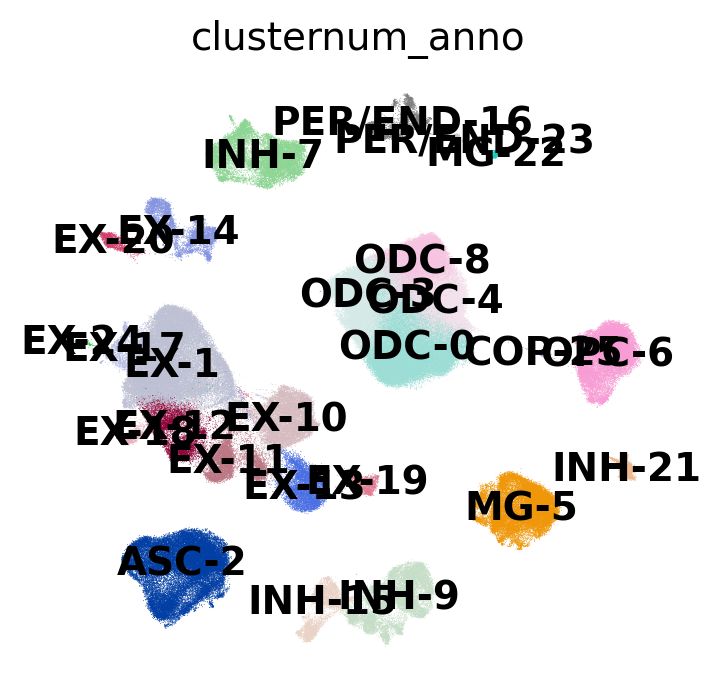

In [21]:
ax = sc.pl.umap( adata,color=["clusternum_anno"],frameon=False, save='_celltype.pdf', legend_loc='on data')


In [22]:
colors = {
    'ODC-0':'orchid', # ODC-0
    'EX-1':'seagreen', #EX-1
    'ASC-2':'tomato', #ASC-2
    'ODC-3':'deeppink', #ODC-3
    'ODC-4':'purple', #ODC-4,
    'MG-5':'cornflowerblue', #MG-5
    'OPC-6':'violet', #OPC-6
    'INH-7':'gold', #INH-7
    'ODC-8':'navy', #ODC-8
    'INH-9':'goldenrod', #INH-9
    'EX-10':'forestgreen', #EX-10
    'EX-11':'limegreen', #EX-11
    'EX-12':'teal', #EX-12
    'EX-13':'mediumturquoise', #EX-13
    'EX-14':'lightseagreen', #EX-14
    'INH-15':'yellow', #INH-15
    'PER/END-16':'orangered', #PER/END-16
    'EX-17':'mediumaquamarine', #EX-17
    'EX-18':'olivedrab', #EX-18
    'EX-19':'darkolivegreen', #EX-19
    'EX-20':'green', #EX-20
    'INH-21':'khaki', #INH-21
    'MG-22':'dodgerblue', #MG-22
    'PER/END-23':'burlywood', #PER/END-23
    'EX-24':'springgreen', #EX-24
    'COP-25':'fuchsia', #COP-25
}

#celltype_palette = sns.set_palette(sns.color_palette(colors))


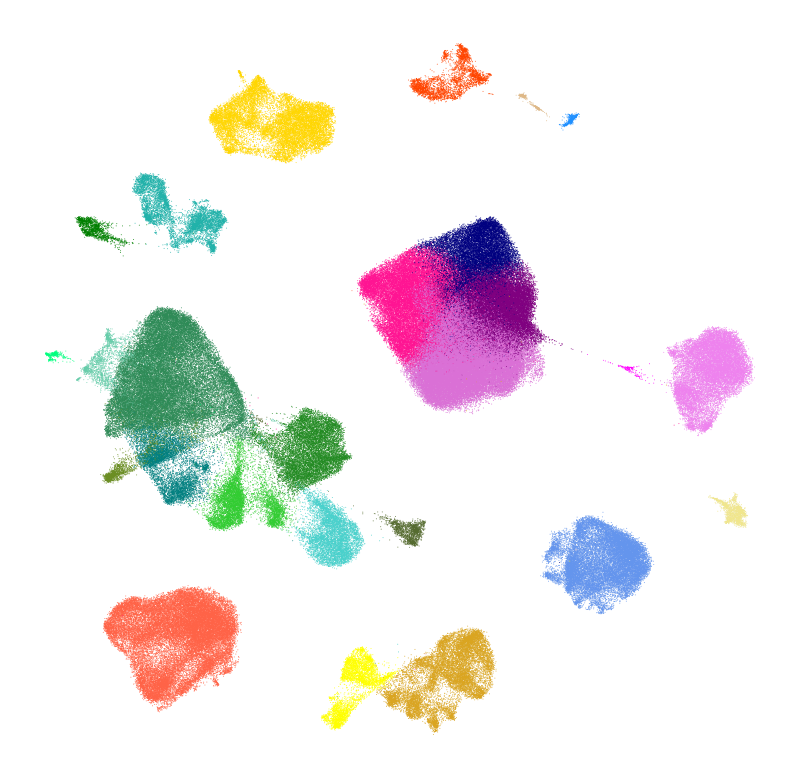

In [23]:
sc.set_figure_params(dpi=100)

df = adata.obs

sns.set_style("white")
plot = sns.scatterplot(
    data=df,
    x='UMAP_1',
    y='UMAP_2',
    hue = 'clusternum_anno',
    linewidth=0,
    alpha=0.85,
    s=0.5,
    rasterized=True,
    legend=False,
    palette=colors
)

sns.despine(bottom = True, left = True)


plot.set(yticks=[])
plot.set(xticks=[])
plot.set(ylabel=None)
plot.set(xlabel=None)
plot.set(title=None)

figure = plt.gcf()
figure.set_size_inches(10,10)
plt.savefig('figures/umap_celltypes_annotated.pdf', dpi=1000)


In [432]:
adata.obs['Dataset_Region'] = adata.obs[['Dataset', 'Region']].agg('-'.join, axis=1)

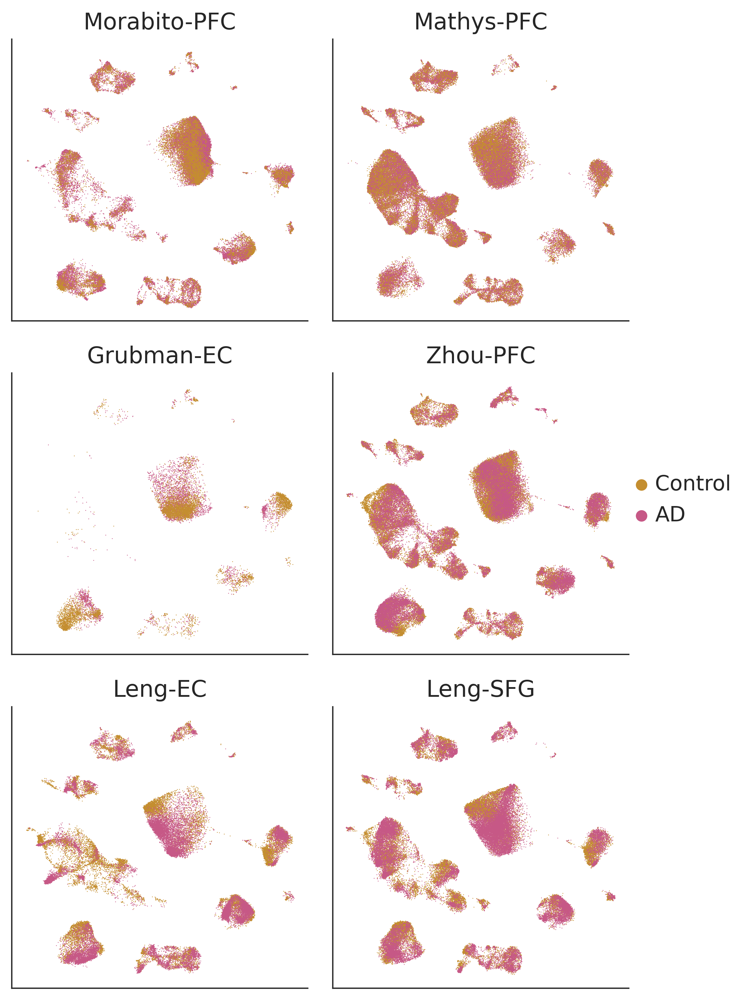

In [460]:



sc.set_figure_params(dpi=400)

df = adata.obs

sns.set_style("white")
g = sns.FacetGrid(df, col='Dataset_Region', col_wrap=2)
g.map_dataframe(
    sns.scatterplot,
    x='UMAP_1',
    y='UMAP_2',
    hue = 'Condition',
    hue_order = ['Control', 'AD'],
    linewidth=0,
    alpha=1,
    s=0.25,
    palette=['#C48E30', '#C65886'],
    rasterized=True
)

# remove axis ticks
g.set(yticks=[])
g.set(xticks=[])
g.set_titles(col_template="{col_name}")

plt.savefig('figures/umap_dataset_split.pdf', dpi=1000)


g.add_legend()

In [430]:
adata.obs.Dataset.value_counts()

Leng        99291
Zhou        77752
Mathys      68326
Morabito    60687
Grubman     10640
Name: Dataset, dtype: int64

## 1 vs all DEGs for each major cell type:

In [69]:
# reload full adata object
adata_full = sc.read_h5ad('{}AD_atlas_integrated.h5ad'.format(data_dir))
adata_full.obs['barcode'] = adata_full.obs.index

In [70]:
adata.obs['barcode'] = adata_full.obs[~adata_full.obs.leiden.isin(['10', '18', '21'])].barcode.to_list()
adata.obs.index = adata.obs['barcode']

In [71]:
# merge obs tables to get the celltype info from the subset adata:
adata_full.obs = adata_full.obs.merge(adata.obs.celltype, how='left', left_index=True, right_index=True)

In [74]:
# re-load model
scvi.data.setup_anndata(
    adata_full,
    layer="counts",
    batch_key = 'SampleID',
    categorical_covariate_keys=['dataset_batch', 'Region', 'Condition', 'braak']
)

model = scvi.model.SCVI.load(adata_full, "trained_model4/", use_cuda=True)


INFO     Using batches from adata.obs["SampleID"]                                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 336613 cells, 16641 genes, 124    
         batches, 1 labels, and 0 proteins. Also registered 4 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [75]:
# differential expression 1 vs all 
de_df = model.differential_expression(
    groupby='celltype'
)

In [196]:

whole_de_df = pd.DataFrame()

for cur_ct in ['ASC', 'EX', 'INH', 'MG', 'ODC', 'OPC']:
    
    print(cur_ct)
    
    # get indices for this celltype
    cur_index = (adata_full.obs.Condition == 'Control') & (adata_full.obs.celltype == cur_ct)
    other_index = (adata_full.obs.Condition == 'Control') & (adata_full.obs.celltype != cur_ct) & (adata_full.obs.index.isin(adata.obs.index))

    cur_de_df = model.differential_expression(
        idx1 = cur_index,
        idx2 = other_index
    )
    cur_de_df['comparison'] = '{} vs Rest'.format(cur_ct)
    
    whole_de_df = pd.concat([whole_de_df, cur_de_df])

In [199]:
whole_de_df.to_csv('{}scvi_celltype_control_DEGs.csv'.format(data_dir))

/home/jovyan/.conda/envs/scvi-env/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/jovyan/.conda/envs/scvi-env/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/jovyan/.conda/envs/scvi-env/lib/python3.6/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

(0.0, 3.0)

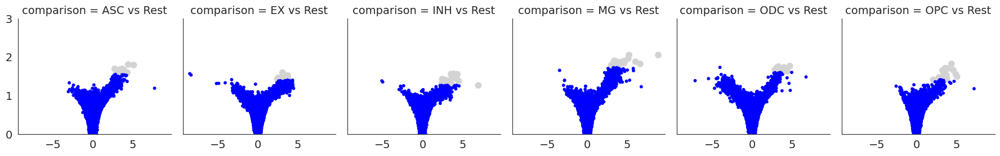

In [156]:
# volcano plots:

# compute natural log of bayes factor:
de_df = de_df.assign(lnbf = lambda x: np.log(x['bayes_factor']))

# color genes with significant bayes factors:
de_df = de_df.assign(high = lambda x: (x['lnbf'] > 1.1) & (x['lfc_median'] > 0))
#de_df['group'] = np.where(de_df.high, 'significant', 'not_significant')
#de_df['group'] = np.where(de_df.index.isin(top_genes), 'top', de_df['group'])
#de_df['size'] = np.where(de_df.high, 2, .5)


plot_df = pd.DataFrame()

for comparison in de_df.comparison.unique():
    
    # subset df 
    cur_df = de_df[de_df.comparison == comparison]
    
    # get top genes for this cluster:
    top_genes = cur_df.sort_values('lnbf', ascending=False).head(20).index.unique().to_list()
    cur_df['group'] = np.where((cur_df.index.isin(top_genes)) & (cur_df.lfc_median > 0), comparison, 'other')
    
    plot_df = pd.concat([plot_df, cur_df])

plot_df = plot_df[~plot_df.comparison.isin(['PER/END vs Rest', 'COP vs Rest'])]

plot_df['size'] = np.where(plot_df['group'] == 'other', 0.1, 2)

sns.set_style("white")
g = sns.FacetGrid(plot_df, col='comparison', col_wrap=8)
g.map_dataframe(
    sns.scatterplot,
    x='lfc_median',
    y='lnbf',
    hue = 'group',
    size='size',
    palette = ['lightgray', 'blue'],
    linewidth=0,
    alpha=1,
    rasterized =True
)

plt.ylim(0, 3)
 



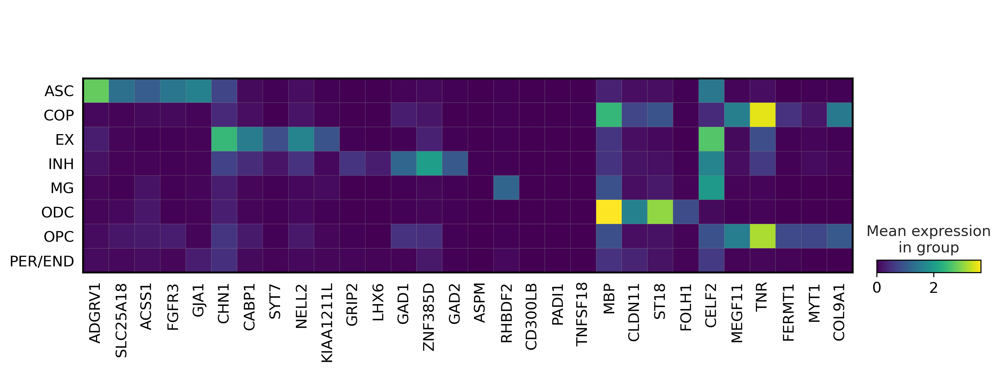

In [223]:
# heatmap of the top marker genes:
markers = []
for comp in whole_de_df.comparison.unique():
    cur_df = whole_de_df[whole_de_df.comparison == comp]
    top_genes = cur_df.sort_values('bayes_factor', ascending=False).head(20).index.unique().to_list()
    markers += top_genes[0:5]
    
    
sc.pl.matrixplot(adata, var_names=markers, groupby='celltype', save=True)

## Gene scoring analysis

Going to do all the plotting with ggplot because I can't figure out how to do what I want with Seaborn

In [206]:
adata.obs = adata.obs.drop(['ASC_score', 'EX_score', 'INH_score', 'MG_score', 'ODC_score', 'OPC_score'], axis=1)

In [208]:
# testing for one cluster:
for comp in whole_de_df.comparison.unique():
    print(comp)
    cur_df = whole_de_df[whole_de_df.comparison == comp]
    top_genes = cur_df.sort_values('bayes_factor', ascending=False).head(20).index.unique().to_list()
    print(top_genes[0:5])
    sc.tl.score_genes(adata, gene_list = top_genes, score_name='{}_score'.format(comp.split()[0]))


ASC vs Rest
['ADGRV1', 'SLC25A18', 'ACSS1', 'FGFR3', 'GJA1']
EX vs Rest
['CHN1', 'CABP1', 'SYT7', 'NELL2', 'KIAA1211L']
INH vs Rest
['GRIP2', 'LHX6', 'GAD1', 'ZNF385D', 'GAD2']
MG vs Rest
['ASPM', 'RHBDF2', 'CD300LB', 'PADI1', 'TNFSF18']
ODC vs Rest
['MBP', 'CLDN11', 'ST18', 'FOLH1', 'CELF2']
OPC vs Rest
['MEGF11', 'TNR', 'FERMT1', 'MYT1', 'COL9A1']


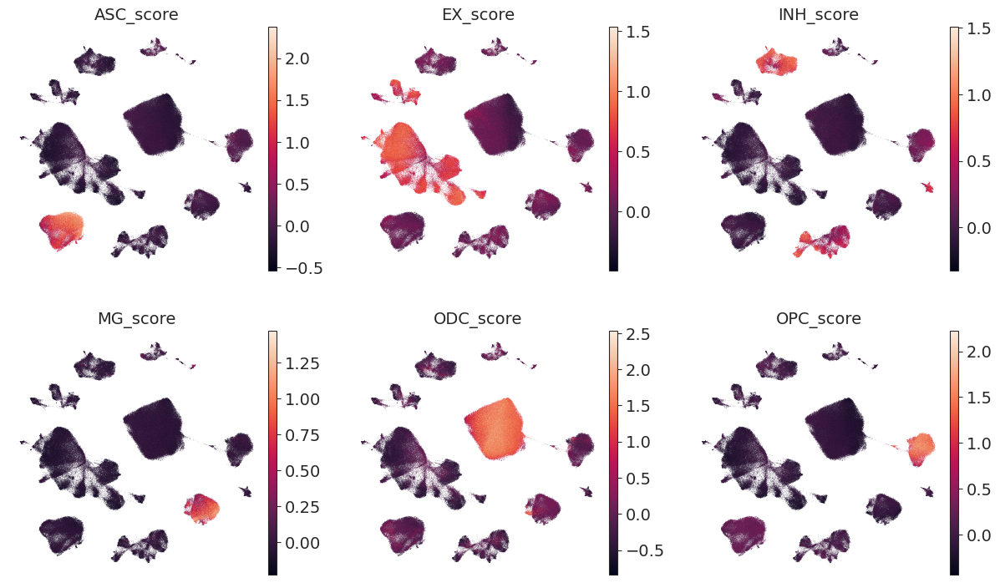

In [210]:
sc.pl.umap(adata, color=['ASC_score', 'EX_score', 'INH_score', 'MG_score', 'ODC_score', 'OPC_score'], frameon=False, ncols=3, palette='viridis')

## Save processed anndata obj

In [24]:
del adata.uns['_scvi']

KeyError: '_scvi'

In [25]:
adata.write('{}AD_atlas_integrated_processed.h5ad'.format(data_dir))

In [212]:
adata.obs.to_csv('{}AD_atlas_integrated_processed_meta.csv'.format(data_dir))